In [140]:
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
from scipy import signal

from convnwb.io import make_session_name

from spiketools.spatial.information import compute_spatial_information
from spiketools.stats.permutations import compute_surrogate_stats
from spiketools.plts.utils import make_axes, make_grid, get_grid_subplot
from spiketools.plts.spatial import plot_heatmap, create_heatmap_title
from spiketools.plts.annotate import add_vlines, color_pvalue

from spiketools.plts.style import drop_spines
from spiketools.plts.stats import plot_surrogates
from spiketools.utils.run import create_methods_list


In [141]:
import sys
sys.path.append('../code')
from models import create_df_place, fit_anova_place
from utils import  compute_firing_rates, compute_trial_firing_rates, compute_t_occupancy, circular_shuffle_unit_fr
sys.path.append('../scripts')
from settings import METHODS, SURROGATES

In [142]:

from scipy.io import loadmat
data = loadmat('/Users/weijiazhang/Data/Train/data_matfile/R1219C_0_train_events.mat')
behavioral_data = pd.read_csv('/Users/weijiazhang/Data/Train/events/events.csv')



## Settings

In [143]:
epochSize = 0.1
numBins = 40
kernelSize = 8
numBinsPos = 40
numBinsSpeed = 25

units = 19

In [144]:
session = {
    'experiment' : 'TRAIN',
    'subject' : 'R1219C',
    'session' : '0'    
}

experiment = session['experiment']
subject = session['subject']
sess = session['session']
session_name = make_session_name(subject,experiment,sess)
session_name

'TRAIN_R1219C_session_0'

In [145]:
# Get behavioral data
df = pd.DataFrame(data['events']['events'][0][0][0])
# Convert object columns to string type
str_cols = ['subj', 'object','timesfile']
for col in str_cols:
    df[col] = df[col].str[0].astype(str)
# Convert numeric columns to appropriate types
int_cols = ['session', 'trialNum', 'blockType', 'driveType'] 
float_cols = ['object_position', 'response_position', 'response_mstime', 'timesoffset','mstime', 'position','speed']
for col in int_cols:
    df[col] = df[col].str[0].astype(int)
for col in float_cols:
    df[col] = df[col].str[0].astype(float)

behavioral_data = df


In [146]:
events_fr = data['events']['fr'][0][0]
events_fr.shape

(7654, 23)

In [147]:
time_offset = df['timesoffset']
time_offset

0       1.169224e+05
1       1.170224e+05
2       1.171224e+05
3       1.172224e+05
4       1.173224e+05
            ...     
7649    2.284070e+06
7650    2.284170e+06
7651    2.284270e+06
7652    2.284370e+06
7653    2.284470e+06
Name: timesoffset, Length: 7654, dtype: float64

In [148]:
df

,subj,session,trialNum,blockType,driveType,object,object_position,response_position,response_mstime,wall_position,...,constant_speed,position,mstime,lfpfile,lfpmstime,lfpoffset,timesfile,timesoffset,eegoffset,eegfile
0,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.970167,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[233845]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.169224e+05,[[233845]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
1,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.835283,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234045]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.170224e+05,[[234045]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
2,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.584817,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234245]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.171224e+05,[[234245]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
3,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.217183,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234445]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.172224e+05,[[234445]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
4,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-32.736283,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234645]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.173224e+05,[[234645]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7649,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],29.248400,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568139]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284070e+06,[[4568139]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
7650,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],30.118150,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568339]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284170e+06,[[4568339]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
7651,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],30.887517,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568539]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284270e+06,[[4568539]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
7652,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],31.569600,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568739]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284370e+06,[[4568739]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...


## Extract Spikes

In [149]:

# Access spikeTimes from the nested structured array
spike_times = data['events']['spikeData'][0][0]['spikeTimes'][0][0][0][units]
print("Spike times shape:", spike_times.shape)
spike_times

Spike times shape: (1963, 1)


array([[9.72000000e+02],
       [5.03536667e+03],
       [6.39073333e+03],
       ...,
       [2.33852447e+06],
       [2.33940327e+06],
       [2.33970867e+06]])

In [150]:
# Get spike name and electrode labels
spike_name = data['events']['spikeData'][0][0]['spikeNames'][0][0][0][units]
print(f"Spike name: {spike_name}")

# Create DataFrame of electrode labels and clean up types
elec_labels = pd.DataFrame(data['events']['spikeData'][0][0]['elecLabels'][0][0][0])
elec_labels['ElectrodeID'] = elec_labels['ElectrodeID'].str[0].astype(int)
elec_labels['Label'] = elec_labels['Label'].str[0].astype(str)
elec_labels = elec_labels[elec_labels['Label'] != 'ainp1']

# Find matching electrode label
label = None
for idx, elec_id in enumerate(elec_labels['ElectrodeID'].values):
    if str(elec_id) in str(spike_name):
        label = elec_labels['Label'].iloc[idx]
        break

Spike name: ['NSX124_2']


In [151]:
speeds = np.array(behavioral_data['speed'])
bad = speeds < 2



In [152]:
# Get speeds and create mask for valid speeds (>= 2)
# speeds = np.array(behavioral_data['speed'])
# bad = speeds < 2
# Apply mask to events_fr, ensuring dimensions match
# behavioral_data = behavioral_data[~bad]
# events_fr = events_fr[~bad,:]

In [153]:
events_fr.shape

(7654, 23)

In [154]:
units_fr = events_fr[:,units]
len(events_fr[1])


23

## Extract Position Data 

In [155]:
positions = behavioral_data['position']
positions = (positions + 34) / 68  # Normalize to 0-1 range
positions[positions < 0] = 0  # Clip values below 0
positions[positions > 1] = 1 
positions 

0       0.000439
1       0.002422
2       0.006106
3       0.011512
4       0.018584
          ...   
7649    0.930124
7650    0.942914
7651    0.954228
7652    0.964259
7653    0.973158
Name: position, Length: 7654, dtype: float64

In [156]:
position = behavioral_data['position']+34

In [157]:
spike_times

array([[9.72000000e+02],
       [5.03536667e+03],
       [6.39073333e+03],
       ...,
       [2.33852447e+06],
       [2.33940327e+06],
       [2.33970867e+06]])

In [158]:
# Get the right edges of every bin
right_edges = time_offset + 99

In [159]:
n_bins = 40
n_bins

40

In [160]:
edges = np.linspace(0, 100, n_bins+1)
edges


array([  0. ,   2.5,   5. ,   7.5,  10. ,  12.5,  15. ,  17.5,  20. ,
        22.5,  25. ,  27.5,  30. ,  32.5,  35. ,  37.5,  40. ,  42.5,
        45. ,  47.5,  50. ,  52.5,  55. ,  57.5,  60. ,  62.5,  65. ,
        67.5,  70. ,  72.5,  75. ,  77.5,  80. ,  82.5,  85. ,  87.5,
        90. ,  92.5,  95. ,  97.5, 100. ])

In [161]:
position = behavioral_data['position'] + 34
position

0        0.029833
1        0.164717
2        0.415183
3        0.782817
4        1.263717
          ...    
7649    63.248400
7650    64.118150
7651    64.887517
7652    65.569600
7653    66.174733
Name: position, Length: 7654, dtype: float64

In [162]:
# Create an index array for the spike times
spike_index = np.arange(len(spike_times), dtype=np.uint32)+1
# Initialize dictionaries to store spikes in each bin and their indices
spikes_in_bin = {}  # Will store spike times that fall within each time bin
spike_index_within_bin = {}  # Will store indices of spikes that fall within each time bin
            

In [167]:
mstime = df['timesoffset']

# Initialize dictionaries to store spikes in each bin and their indices
spikes_in_bin = {}
spike_index_within_bin = {}

# Loop through each time bin
            # Loop through each time bin
for k in range(len(mstime)):
    # Find spikes that fall within the current time bin
    mask = (spike_times >= mstime[k]) & (spike_times <= right_edges[k])
    spike_indices = np.where(mask)[0]
    print(spike_indices)
    if len(spike_indices) > 0:
        spikes_in_bin[k] = spike_index[spike_indices]
    else:
        spikes_in_bin[k] = 0


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[85]
[]
[]
[]
[86]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[87]
[]
[]
[88]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[89]
[]
[]
[]
[]
[90]
[]
[]
[]
[91]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[92]
[]
[93]
[]
[94]
[]
[]
[95]
[]
[96]
[]
[]
[]
[]
[]
[]
[]
[]
[104]
[]
[]
[105]
[]
[]
[]
[106]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[107]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[108]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[109]
[]
[]
[]
[]
[110]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[111]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[112]
[]
[]
[]
[]
[113]
[]
[]
[]
[]
[]
[]
[114]
[]
[]
[]
[]
[]
[]
[]
[115]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[131]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[132]
[133]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

In [168]:
spikes_in_bin

{0: 0,
 1: 0,
 2: 0,
 3: 0,
 4: 0,
 5: 0,
 6: 0,
 7: 0,
 8: 0,
 9: 0,
 10: 0,
 11: 0,
 12: 0,
 13: array([86], dtype=uint32),
 14: 0,
 15: 0,
 16: 0,
 17: array([87], dtype=uint32),
 18: 0,
 19: 0,
 20: 0,
 21: 0,
 22: 0,
 23: 0,
 24: 0,
 25: 0,
 26: 0,
 27: 0,
 28: 0,
 29: 0,
 30: 0,
 31: 0,
 32: 0,
 33: 0,
 34: 0,
 35: 0,
 36: 0,
 37: 0,
 38: 0,
 39: 0,
 40: 0,
 41: 0,
 42: 0,
 43: 0,
 44: array([88], dtype=uint32),
 45: 0,
 46: 0,
 47: array([89], dtype=uint32),
 48: 0,
 49: 0,
 50: 0,
 51: 0,
 52: 0,
 53: 0,
 54: 0,
 55: 0,
 56: 0,
 57: 0,
 58: 0,
 59: 0,
 60: 0,
 61: 0,
 62: 0,
 63: 0,
 64: 0,
 65: array([90], dtype=uint32),
 66: 0,
 67: 0,
 68: 0,
 69: 0,
 70: array([91], dtype=uint32),
 71: 0,
 72: 0,
 73: 0,
 74: array([92], dtype=uint32),
 75: 0,
 76: 0,
 77: 0,
 78: 0,
 79: 0,
 80: 0,
 81: 0,
 82: 0,
 83: 0,
 84: 0,
 85: 0,
 86: 0,
 87: 0,
 88: array([93], dtype=uint32),
 89: 0,
 90: array([94], dtype=uint32),
 91: 0,
 92: array([95], dtype=uint32),
 93: 0,
 94: 0,
 95: array

In [165]:
# Convert dictionary to a list of arrays
spikes_in_bin_list = []
for k in range(len(mstime)):
    if k in spikes_in_bin and len(spikes_in_bin[k]) > 0:
        spikes_in_bin_list.append(spikes_in_bin[k])
    else:
        spikes_in_bin_list.append([])

# Flatten the list of arrays into a single array if needed
spikes_in_bin_idx = np.concatenate([arr for arr in spikes_in_bin_list if len(arr) > 0])
spikes_in_bin_idx

TypeError: object of type 'int' has no len()

In [166]:
trialNum = behavioral_data['trialNum']
# Find where trial numbers change
trial_changes = np.where(np.diff(np.concatenate(([1], trialNum.values))))[0]
# Initialize lists to store positions and trial numbers for each bin
pos_in_bin = [[] for _ in range(len(spikes_in_bin))]
trial_in_bin = [[] for _ in range(len(spikes_in_bin))]


In [27]:
# Find which bin indicates a change in trial
trial_changes = np.where(np.diff(trialNum))[0]+1
print(f"Indices where trial number changes: {trial_changes}")
print(trialNum[0])

Indices where trial number changes: [ 104  229  322  417  567  749  845  974 1097 1211 1341 1467 1692 1849
 1955 2091 2230 2348 2478 2625 2731 2942 3033 3175 3276 3421 3533 3628
 3708 3837 3934 4063 4170 4293 4403 4474 4578 4739 4834 4953 5037 5146
 5281 5403 5567 5662 5753 5968 6064 6153 6279 6413 6545 6672 6746 6814
 6907 7048 7197 7287 7372 7484 7568]
1


In [76]:
left_upsample_idx =  [0] + list(trial_changes)
right_upsample_idx = np.array([tc-1 for tc in trial_changes]+ [len(positions)])
print(left_upsample_idx)
print(right_upsample_idx)

[0, 104, 229, 322, 417, 567, 749, 845, 974, 1097, 1211, 1341, 1467, 1692, 1849, 1955, 2091, 2230, 2348, 2478, 2625, 2731, 2942, 3033, 3175, 3276, 3421, 3533, 3628, 3708, 3837, 3934, 4063, 4170, 4293, 4403, 4474, 4578, 4739, 4834, 4953, 5037, 5146, 5281, 5403, 5567, 5662, 5753, 5968, 6064, 6153, 6279, 6413, 6545, 6672, 6746, 6814, 6907, 7048, 7197, 7287, 7372, 7484, 7568]
[ 103  228  321  416  566  748  844  973 1096 1210 1340 1466 1691 1848
 1954 2090 2229 2347 2477 2624 2730 2941 3032 3174 3275 3420 3532 3627
 3707 3836 3933 4062 4169 4292 4402 4473 4577 4738 4833 4952 5036 5145
 5280 5402 5566 5661 5752 5967 6063 6152 6278 6412 6544 6671 6745 6813
 6906 7047 7196 7286 7371 7483 7567 7654]


In [91]:
from scipy.signal import resample_poly

# upsampled_segment = resample_poly(segment, up=100, down=1)

position_upsample = []

for k in range(len(left_upsample_idx)):
    segment = position[left_upsample_idx[k]:right_upsample_idx[k] + 1]
    print(segment)
    upsampled_segment = resample_poly(segment, up=100, down=1)
  # 100x upsampling
    position_upsample.append(upsampled_segment)

0       0.029833
1       0.164717
2       0.415183
3       0.782817
4       1.263717
         ...    
99     65.426500
100    66.419950
101    67.414050
102    68.323720
103    68.820500
Name: position, Length: 104, dtype: float64
104     0.002700
105     0.025067
106     0.099133
107     0.222233
108     0.394867
         ...    
224    65.520283
225    66.326883
226    67.131833
227    67.935517
228    68.604975
Name: position, Length: 125, dtype: float64
229     0.002000
230     0.028483
231     0.127833
232     0.302333
233     0.551850
         ...    
317    66.020600
318    66.769967
319    67.519400
320    68.205140
321    68.640850
Name: position, Length: 93, dtype: float64
322     0.018417
323     0.087317
324     0.208150
325     0.381567
326     0.606833
         ...    
412    65.078367
413    66.161150
414    67.246383
415    68.238980
416    68.778500
Name: position, Length: 95, dtype: float64
417     0.001800
418     0.025667
419     0.115633
420     0.271633
421     0.

In [92]:
position_upsample

[array([0.02985347, 0.03055043, 0.03125666, ..., 1.47220817, 0.97016949,
        0.4793983 ]),
 array([0.00270182, 0.00274795, 0.00279484, ..., 1.46926672, 0.96823796,
        0.47844721]),
 array([0.00200135, 0.0020318 , 0.0020629 , ..., 1.46843759, 0.96768608,
        0.47817182]),
 array([0.0184291 , 0.01881704, 0.01920944, ..., 1.47146469, 0.96967974,
        0.47915639]),
 array([0.00180122, 0.00182327, 0.00184587, ..., 1.46891012, 0.96799487,
        0.47832316]),
 array([0.00754509, 0.00774317, 0.00794448, ..., 1.37424151, 0.90560873,
        0.4474955 ]),
 array([0.00847238, 0.00863347, 0.00879672, ..., 1.46864027, 0.96782525,
        0.47824333]),
 array([0.01896279, 0.01936075, 0.01976327, ..., 1.46994063, 0.96867573,
        0.47866044]),
 array([0.01178795, 0.01205925, 0.01233429, ..., 1.46869138, 0.9678591 ,
        0.47826014]),
 array([0.00953143, 0.00974801, 0.00996775, ..., 1.47087153, 0.96928883,
        0.47896321]),
 array([0.01070722, 0.01094657, 0.01118973, ..., 1

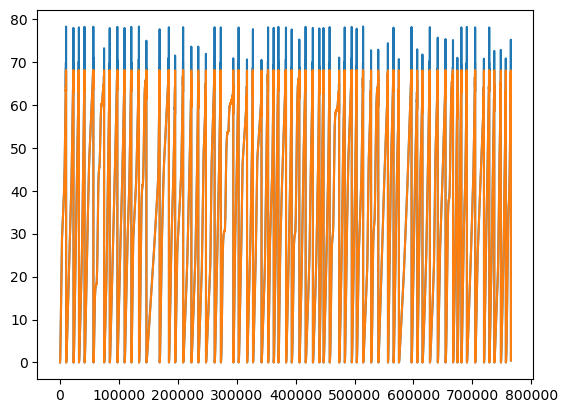

In [106]:
pos_for_resample = np.concatenate(position_upsample)
plt.plot(pos_for_resample)
pos_for_resample[pos_for_resample > 68] = 68
plt.plot(pos_for_resample)
# Reshape the array to have 100 rows and length of positions columns
pos_for_resample = pos_for_resample.reshape(100, len(position))

In [137]:
spikes_in_bin
# Replace empty bins with NaN values in spikes_in_bin dictionary
import numpy as np

# Create a copy of the dictionary to avoid modifying it during iteration
spikes_in_bin_with_nan = {}

# Iterate through all keys in the original dictionary
for k in spikes_in_bin.keys():
    # If the value is an empty list or empty array, replace with NaN
    if isinstance(spikes_in_bin[k], list) and len(spikes_in_bin[k]) == 0:
        spikes_in_bin_with_nan[k] = np.nan
    elif isinstance(spikes_in_bin[k], np.ndarray) and spikes_in_bin[k].size == 0:
        spikes_in_bin_with_nan[k] = np.nan
    else:
        # Keep the original value
        spikes_in_bin_with_nan[k] = spikes_in_bin[k]

# Replace the original dictionary with the updated one
spikes_in_bin = spikes_in_bin_with_nan

spikes_in_bin

{0: nan,
 1: nan,
 2: nan,
 3: nan,
 4: nan,
 5: nan,
 6: nan,
 7: nan,
 8: nan,
 9: nan,
 10: nan,
 11: nan,
 12: nan,
 13: array([86], dtype=uint32),
 14: nan,
 15: nan,
 16: nan,
 17: array([87], dtype=uint32),
 18: nan,
 19: nan,
 20: nan,
 21: nan,
 22: nan,
 23: nan,
 24: nan,
 25: nan,
 26: nan,
 27: nan,
 28: nan,
 29: nan,
 30: nan,
 31: nan,
 32: nan,
 33: nan,
 34: nan,
 35: nan,
 36: nan,
 37: nan,
 38: nan,
 39: nan,
 40: nan,
 41: nan,
 42: nan,
 43: nan,
 44: array([88], dtype=uint32),
 45: nan,
 46: nan,
 47: array([89], dtype=uint32),
 48: nan,
 49: nan,
 50: nan,
 51: nan,
 52: nan,
 53: nan,
 54: nan,
 55: nan,
 56: nan,
 57: nan,
 58: nan,
 59: nan,
 60: nan,
 61: nan,
 62: nan,
 63: nan,
 64: nan,
 65: array([90], dtype=uint32),
 66: nan,
 67: nan,
 68: nan,
 69: nan,
 70: array([91], dtype=uint32),
 71: nan,
 72: nan,
 73: nan,
 74: array([92], dtype=uint32),
 75: nan,
 76: nan,
 77: nan,
 78: nan,
 79: nan,
 80: nan,
 81: nan,
 82: nan,
 83: nan,
 84: nan,
 85: n

In [169]:
spike_position = np.zeros(len(position))

for k in range(len(spikes_in_bin)):
    if isinstance(spikes_in_bin[k], np.ndarray) and spikes_in_bin[k].size > 0:
        spike_position[k] = position[k]
    else:
        spike_position[k] = 0
# ## get trial changes
# trial_changes = np.where(np.diff(trialNum))[0]+1

# ## split spike_position into trials
# spike_position_by_trial = {}
# current_trial = trialNum[0]
# trial_indices = {}

# # Create dictionary mapping trial numbers to indices
# for i, trial in enumerate(trialNum):
#     if trial not in trial_indices:
#         trial_indices[trial] = []
#     trial_indices[trial].append(i)

# # Split spike_position by trial
# for trial in np.unique(trialNum):
#     indices = trial_indices[trial]
#     spike_position_by_trial[trial] = {idx: spike_position[idx] for idx in indices if idx in spike_position}




In [183]:
spike_position[spike_position < 1] = np.nan

Text(0.5, 0, 'Position')

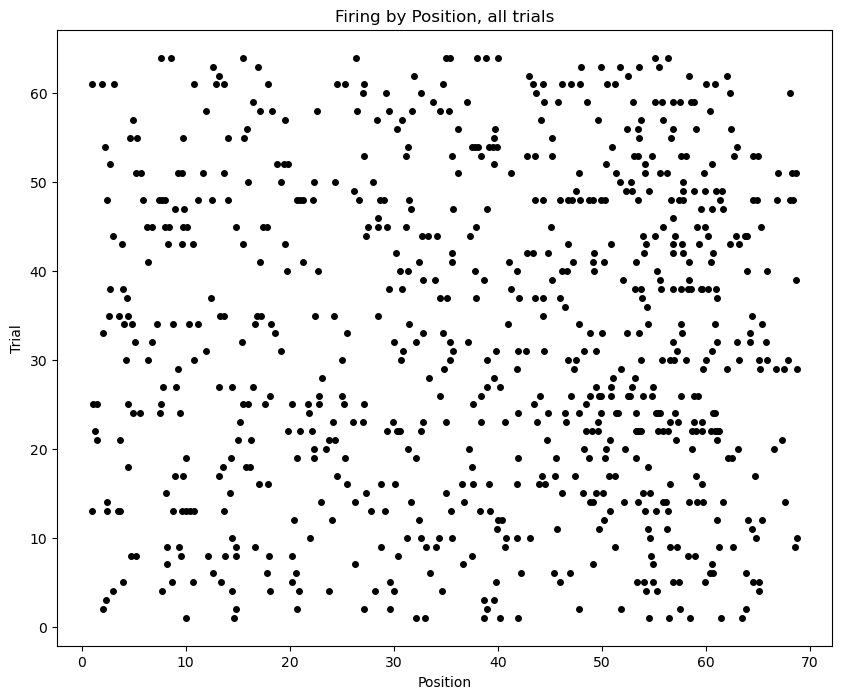

In [184]:

    spikes_positions_trials = [[] for _ in range(64)]
    
    # Create a figure
    plt.figure(figsize=(10, 8))
    
    # For each trial
    for num_trial in range(64):
        # Define trial indices
        trial_idx = [0, *trial_changes, len(spike_position)]
        
        # Extract spike positions for this trial
        if num_trial < len(trial_idx) - 1:
            trial_start = trial_idx[num_trial]
            trial_end = trial_idx[num_trial + 1]
            spikes_positions_trials[num_trial] = spike_position[trial_start:trial_end]
            
            # Plot spike positions for this trial
            if len(spikes_positions_trials[num_trial]) > 0:
                plt.plot(spikes_positions_trials[num_trial], 
                         [num_trial + 1] * len(spikes_positions_trials[num_trial]), 
                         'k.', markersize=8)
    
    # Add labels and title
    plt.title('Firing by Position, all trials')
    plt.ylabel('Trial')
    plt.xlabel('Position')
    
    # Save the figure
    #plot12 = f'Raster_all_trials_cluster{clust}.png'
    #plt.savefig(plot12)
    #plt.close()

In [128]:
# Display the entire spike position array
print("Spike position array:")
for i in range(len(spike_position[:100])):
    print(f"Index {i}: {spike_position[i]}")

Spike position array:
Index 0: 0.0
Index 1: 0.0
Index 2: 0.0
Index 3: 0.0
Index 4: 0.0
Index 5: 0.0
Index 6: 0.0
Index 7: 0.0
Index 8: 0.0
Index 9: 0.0
Index 10: 0.0
Index 11: 0.0
Index 12: 0.0
Index 13: 0.0
Index 14: 0.0
Index 15: 0.0
Index 16: 0.0
Index 17: 0.0
Index 18: 0.0
Index 19: 0.0
Index 20: 0.0
Index 21: 0.0
Index 22: 0.0
Index 23: 0.0
Index 24: 0.0
Index 25: 0.0
Index 26: 0.0
Index 27: 0.0
Index 28: 0.0
Index 29: 0.0
Index 30: 0.0
Index 31: 0.0
Index 32: 0.0
Index 33: 0.0
Index 34: 0.0
Index 35: 0.0
Index 36: 0.0
Index 37: 0.0
Index 38: 0.0
Index 39: 0.0
Index 40: 0.0
Index 41: 0.0
Index 42: 0.0
Index 43: 0.0
Index 44: 0.0
Index 45: 0.0
Index 46: 0.0
Index 47: 0.0
Index 48: 0.0
Index 49: 0.0
Index 50: 0.0
Index 51: 0.0
Index 52: 0.0
Index 53: 0.0
Index 54: 0.0
Index 55: 0.0
Index 56: 0.0
Index 57: 0.0
Index 58: 0.0
Index 59: 0.0
Index 60: 0.0
Index 61: 0.0
Index 62: 0.0
Index 63: 0.0
Index 64: 0.0
Index 65: 0.0
Index 66: 0.0
Index 67: 0.0
Index 68: 0.0
Index 69: 0.0
Index 70

In [111]:
# Get the first row of the resampled position data
print("First row of position data:", pos_for_resample[0][:10], "...")

# Create a dictionary to store spike positions for each time bin
spike_position = {}

# For each time bin, extract the positions where spikes occurred
for k in range(len(spikes_in_bin)):
    if k in spikes_in_bin and len(spikes_in_bin[k]) > 0:
        # Get positions at times when spikes occurred
        spike_position[k] = pos_for_resample[spikes_in_bin[k], k]
    else:
        # No spikes in this bin
        spike_position[k] = []

# Print a few examples
print("Spike positions for first few bins with spikes:")
for k in list(spike_position.keys())[:5]:
    if len(spike_position[k]) > 0:
        print(f"Bin {k}: {spike_position[k]}")

First row of position data: [0.02985347 0.03055043 0.03125666 0.03197227 0.03269731 0.03343187
 0.03417603 0.03492988 0.03569351 0.03646702] ...


IndexError: index 105 is out of bounds for axis 0 with size 100

In [ ]:
for k = 1:length(position)
    # if sum(diff(pos_for_resample(:,k))) < 0 % this is a problem with upsampling the position...it means position is decreasing at the endpoint :/
    #     pos_for_resample(:,k) = NaN;
    # end
    spike_position{1,k} = pos_for_resample(spike_in_bin{k},k)';
end

In [100]:
import numpy as np

# Assume: 
# - pos_for_resample is a 2D array of shape (n_timepoints, n_trials)
# - spike_index_within_bin is a list of arrays: one array of spike indices per trial
# Goal: Create a list spike_position with spike-aligned positions

spike_position = []

for k in range(pos_for_resample.shape[1]):
    pos_trace = pos_for_resample[:, k]
    print(pos_trace)
    
    # # Check for non-monotonic (decreasing) behavior
    # if np.sum(np.diff(pos_trace)) < 0:
    #     pos_for_resample[:, k] = np.nan  # mark entire column as NaN
    #     spike_position.append(np.array([]))  # optionally: store empty array
    # else:
    #     spike_indices = spike_index_within_bin[k]
    #     spike_pos = pos_trace[spike_indices]
    #     spike_position.append(spike_pos)


[2.98534731e-02 4.35917365e+01 2.17723194e+01 9.48800497e-03
 5.79141622e+01 3.53095430e+01 2.50949804e+01 5.95322114e+01
 1.81015857e+01 5.65154839e+01 6.68252443e+00 6.77430757e+01
 3.72037016e+01 1.00092846e+01 5.22674514e+01 2.92132432e+01
 1.03080504e+01 4.63784725e+01 3.20844886e+01 6.55432786e+01
 1.22172780e+01 2.87936719e+01 6.05584401e+01 4.48888140e+01
 6.57237351e+01 3.85285437e+01 2.55559346e+01 5.07311280e+01
 1.67718440e+01 5.88136921e+01 2.37904021e+01 7.90708508e+00
 5.30111794e+01 1.42507498e+01 5.93015765e+01 3.10420349e+01
 1.79233758e+01 5.23029234e+01 6.09734690e+01 3.56496613e+01
 1.56289363e+01 5.45843193e+01 1.84468450e+01 6.28995155e+00
 5.12824472e+01 7.91011444e+00 6.14434467e+01 4.18879922e+01
 4.05799373e+01 3.24871923e+01 6.51765862e+01 3.87978462e+01
 2.92973037e+01 6.53029689e+01 4.77312091e+01 1.38094844e+01
 6.45166529e+01 3.25929808e+01 3.51378571e+01 1.99858667e+01
 5.82052564e+00 5.69019746e+01 1.28123927e+00 6.12177961e+01
 4.87152938e+01 1.477091

In [98]:
spike_position

{}

In [68]:
# Create an array to store upsampled positions
upsampled_position = []
for i in range(len(positions)-1):
    upsampled_position.append(np.linspace(position[i], position[i+1], 100))

len(upsampled_position)

7653

In [64]:
upsampled_position

array([0.96425882, 0.96434871, 0.9644386 , 0.96452849, 0.96461838,
       0.96470827, 0.96479816, 0.96488805, 0.96497794, 0.96506783,
       0.96515771, 0.9652476 , 0.96533749, 0.96542738, 0.96551727,
       0.96560716, 0.96569705, 0.96578694, 0.96587683, 0.96596672,
       0.96605661, 0.96614649, 0.96623638, 0.96632627, 0.96641616,
       0.96650605, 0.96659594, 0.96668583, 0.96677572, 0.96686561,
       0.9669555 , 0.96704539, 0.96713527, 0.96722516, 0.96731505,
       0.96740494, 0.96749483, 0.96758472, 0.96767461, 0.9677645 ,
       0.96785439, 0.96794428, 0.96803417, 0.96812405, 0.96821394,
       0.96830383, 0.96839372, 0.96848361, 0.9685735 , 0.96866339,
       0.96875328, 0.96884317, 0.96893306, 0.96902295, 0.96911283,
       0.96920272, 0.96929261, 0.9693825 , 0.96947239, 0.96956228,
       0.96965217, 0.96974206, 0.96983195, 0.96992184, 0.97001173,
       0.97010161, 0.9701915 , 0.97028139, 0.97037128, 0.97046117,
       0.97055106, 0.97064095, 0.97073084, 0.97082073, 0.97091

In [53]:
# left_upsample_idx = [0] + list(trial_changes)
# right_upsample_idx = list(trial_changes) + [len(positions)]
# print(left_upsample_idx)
# print(right_upsample_idx)


position_upsample = []

# Initialize the list with empty lists for each trial
for _ in range(len(left_upsample_idx)):
    position_upsample.append([])

# Process each trial separately
for k in range(len(left_upsample_idx)):
    start_idx = left_upsample_idx[k]
    end_idx = right_upsample_idx[k]
    
    # Process each position in the trial
    for i in range(start_idx, end_idx):  # Subtract 1 to avoid index out of bounds
        print(i)
        # Create 100 evenly spaced samples between the current position and the next position
        if i+1 < len(positions):    
            upsampled = np.linspace(positions[i], positions[i+1], 100)
            # Add these 100 samples to the current trial's position data
            position_upsample[k].extend(upsampled)



0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [58]:
pos_for_resample.shape

(765300,)

In [56]:
         # Convert the list of lists to a numpy array
         pos_for_resample = np.concatenate(position_upsample)
         
         # Cap the maximum position value at 68
         pos_for_resample[pos_for_resample > 68] = 68
         
         # Reshape the array to have 100 rows and length of positions columns
         pos_for_resample = pos_for_resample.reshape(100, len(positions))

ValueError: cannot reshape array of size 765300 into shape (100,7654)

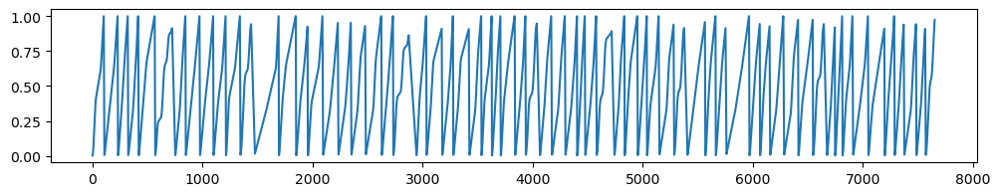

In [17]:
fig,ax = plt.subplots(1,1,figsize=(12,2))
plt.plot(positions)

### Bin positions into percentage along the track

In [18]:
edges_pos = np.linspace(0, 100, numBinsPos+1)
pos_bin = np.digitize(positions*100, edges_pos)


count, _ = np.histogram(positions*100, bins=edges_pos)

## Occupancy

In [19]:
counts = count[:numBins]
occ = counts * epochSize
pos_bin.shape

(6957,)

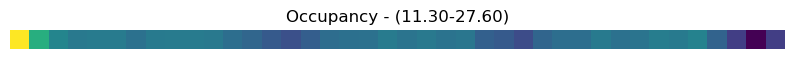

In [20]:
plot_heatmap(occ, title= create_heatmap_title('Occupancy', occ), figsize=(10, 6))

## Smoothing Kernel

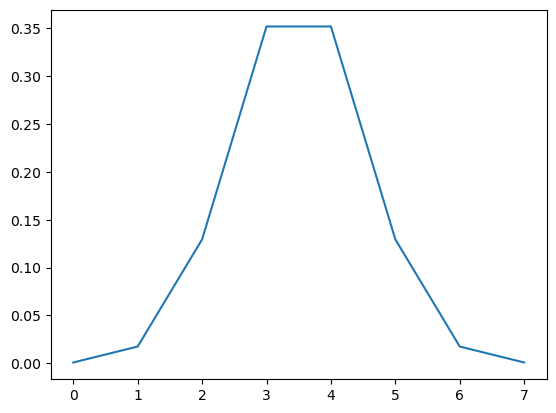

In [21]:
kernelSize = 8
g = signal.windows.gaussian(kernelSize, std=1)
g = g/np.sum(g)
plt.plot(g)

In [79]:
place_bins = compute_firing_rates(units_fr, pos_bin, occ, g, numBins, epochSize)

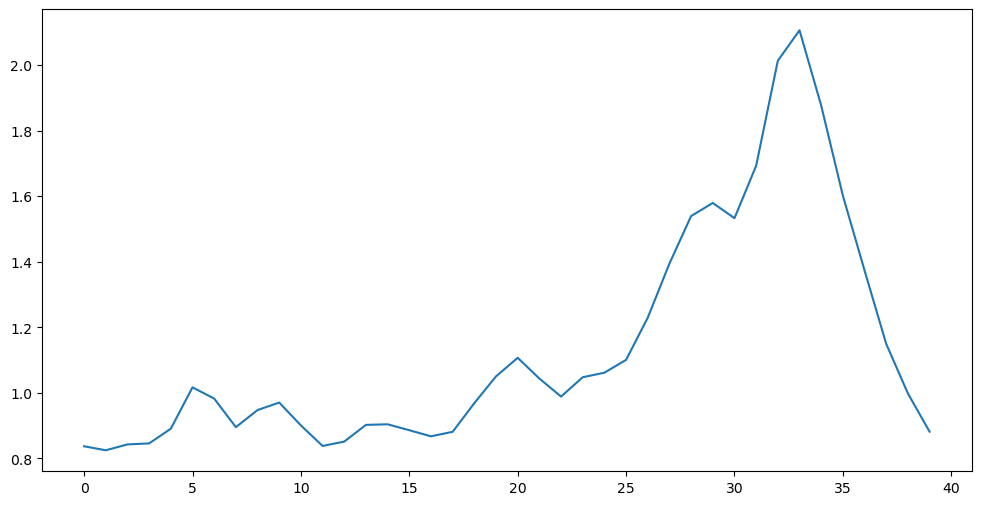

In [80]:
fig,ax = plt.subplots(1,1,figsize=(12,6))
plt.plot(place_bins)

## Compute Smoothed Firing Rates by Trial

In [81]:
# Bin by trial number
edges_trial = np.arange(0.5, 65, 1)  # 0.5:1:65 in MATLAB
trial_bin = np.array(behavioral_data['trialNum'])

In [82]:
behavioral_data

,subj,session,trialNum,blockType,driveType,object,object_position,response_position,response_mstime,wall_position,...,constant_speed,position,mstime,lfpfile,lfpmstime,lfpoffset,timesfile,timesoffset,eegoffset,eegfile
1,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.835283,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234045]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.170224e+05,[[234045]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
2,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.584817,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234245]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.171224e+05,[[234245]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
3,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-33.217183,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234445]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.172224e+05,[[234445]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
4,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-32.736283,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234645]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.173224e+05,[[234645]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
5,R1219C,0,1,1,0,barrel.egg,-19.2132,-25.80130,1.474039e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],-32.138033,1.474039e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[234845]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,1.174224e+05,[[234845]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7649,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],29.248400,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568139]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284070e+06,[[4568139]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
7650,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],30.118150,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568339]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284170e+06,[[4568339]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
7651,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],30.887517,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568539]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284270e+06,[[4568539]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...
7652,R1219C,0,64,2,1,desk.egg,-7.1393,-5.58005,1.474041e+12,"[[nan, nan, nan, nan, nan, nan]]",...,[[0]],31.569600,1.474041e+12,[/data10/RAM/subjects/R1219C/lfp.noreref/_2016...,[],[[4568739]],/data10/RAM/subjects/R1219C/npt/20160916-11053...,2.284370e+06,[[4568739]],[/Users/Salmonster/Volumes/rhino/data10/RAM/su...


## Compute Trial Occupancy

In [84]:
trial_occupancy = compute_t_occupancy(trial_bin, pos_bin, edges_trial, edges_pos, epochSize)

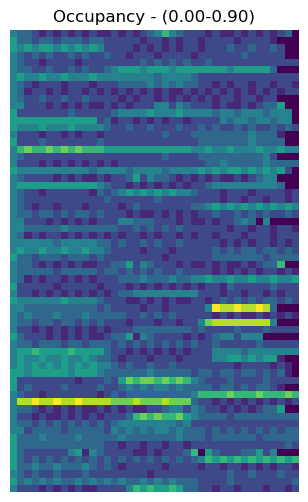

In [85]:
plot_heatmap(trial_occupancy, title= create_heatmap_title('Occupancy', trial_occupancy), figsize=(10, 6))

In [88]:
trial_place_bins, trial_fr = compute_trial_firing_rates(trial_bin, pos_bin, units_fr, edges_trial, edges_pos, trial_occupancy, kernelSize, epochSize)

/Users/weijiazhang/code/AnalyzeTrain/notebooks/../code/utils.py:148: RuntimeWarning: invalid value encountered in divide
  trial_fr = trial_spikes/trial_occupancy


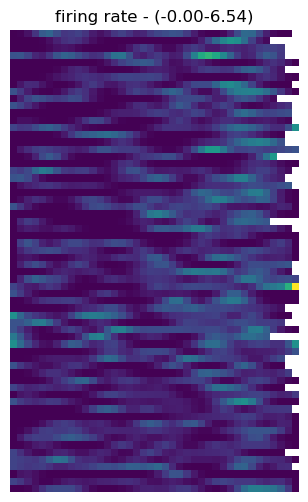

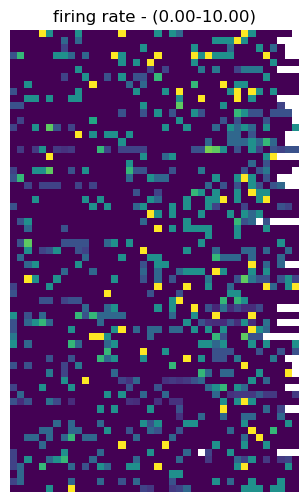

In [89]:
plot_heatmap(trial_place_bins, title= create_heatmap_title('firing rate', trial_place_bins[:,:-3]), figsize=(5, 6))
plot_heatmap(trial_fr, title= create_heatmap_title('firing rate', trial_fr[:,:-3]), figsize=(5, 6))

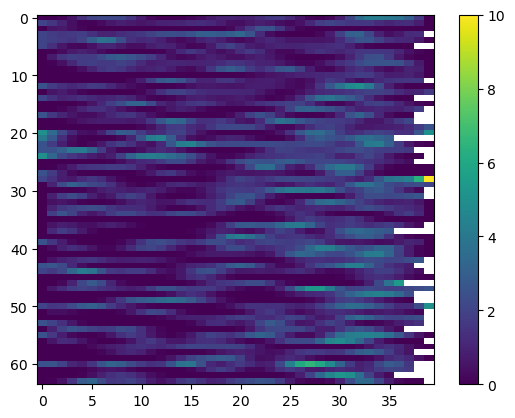

In [90]:
plt.imshow(trial_place_bins[:, :], aspect='auto')

plt.colorbar()
plt.show()

In [91]:
place_bins = np.nanmean(trial_place_bins,axis = 0)
place_sem = np.nanstd(trial_place_bins,axis = 0)/np.sqrt(trial_place_bins.shape[0])

s_bins = np.linspace(0, 40, numBinsPos+1)


In [92]:
fr_bins = np.nanmean(trial_fr,axis = 0)
fr_sem = np.nanstd(trial_fr,axis = 0)/np.sqrt(trial_fr.shape[0])


## Statistical Analysis

In [93]:
results = {}

### Spatial Information

In [94]:
# Compute mutual information of spiking and location
results['place_info'] = compute_spatial_information(place_bins, occ, normalize=False)
results['place_fr_info'] = compute_spatial_information(fr_bins, occ, normalize=False)
print(results['place_info'])
print(results['place_fr_info'])


0.06297535499833747
0.11090491084887405


### ANOVA

In [95]:
# Create the dataframe
df = create_df_place(trial_place_bins[:,:-3])
results['place_anova']= fit_anova_place(df)
# Check the computed place F-value
print('The ANOVA place F-value is {:4.2f}'.format(results['place_anova']))

The ANOVA place F-value is 7.80


In [96]:
df_fr = create_df_place(trial_fr[:,:-3])
results['place_fr_anova']= fit_anova_place(df_fr)
# Check the computed place F-value
print('The ANOVA place F-value is {:4.2f}'.format(results['place_fr_anova']))


The ANOVA place F-value is 3.06


In [97]:
# Shuffle settings
shuffle_approach = 'CIRCULAR' # 'ISI', 'BINCIRC'
n_surrogates =1000

In [98]:

shuffles = circular_shuffle_unit_fr(units_fr, n_surrogates)




In [99]:
METHODS

{'PLACE': ['ANOVA', 'INFO'], 'PLACE_FR': ['ANOVA', 'INFO']}

In [100]:
#METHODS = ['place_info','place_anova','place_info_fr','place_anova_fr']

In [101]:
surr_analyses = create_methods_list(METHODS)
surrs = {analysis : \
                    np.zeros(SURROGATES['n_shuffles']) for analysis in surr_analyses}


In [102]:
surrs.keys()

dict_keys(['place_anova', 'place_info', 'place_fr_anova', 'place_fr_info'])

In [103]:
for ind, shuffle in enumerate(shuffles):
    surr_place_bins = compute_firing_rates(shuffle, pos_bin, occ, g, numBins, epochSize)
    surr_trial_place_bins, surr_trial_fr = compute_trial_firing_rates(trial_bin, pos_bin, shuffle, edges_trial, edges_pos, trial_occupancy, kernelSize, epochSize)
    surr_fr = np.nanmean(surr_trial_fr,axis = 0)
    #surr_place_bins= np.nanmean(surr_trial_place_bins,axis = 0)
    surrs['place_info'][ind] = compute_spatial_information(surr_place_bins, occ, normalize=False)
    surrs['place_anova'][ind] = fit_anova_place(create_df_place(surr_trial_place_bins))
    surrs['place_fr_info'][ind] = compute_spatial_information(surr_fr, occ, normalize=False)
    surrs['place_fr_anova'][ind] = fit_anova_place(create_df_place(surr_trial_fr))

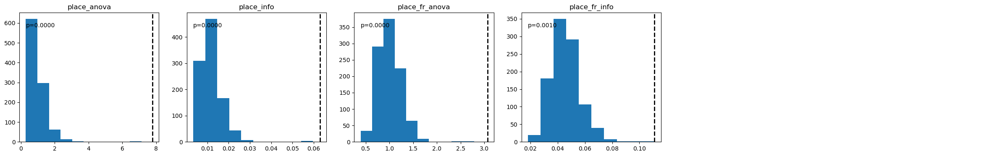

In [104]:
axes = make_axes(4, 6, figsize=(30, 4))
i = 0
for analysis in surr_analyses:
    results[analysis + '_surr_p_val'], results[analysis + '_surr_z_score'] = \
                        compute_surrogate_stats(results[analysis], surrs[analysis],title = analysis,plot = True, ax=axes[i])
    i = i+1


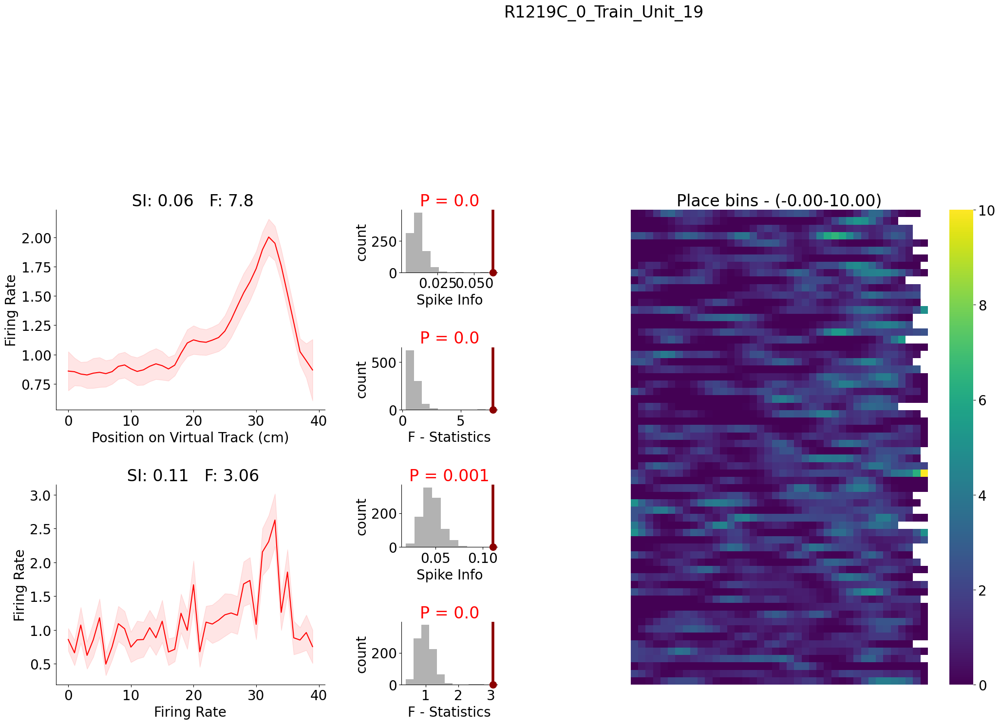

In [ ]:
plt.rcParams.update({'font.size': 20})
grid = make_grid(6, 7, wspace=.8, hspace=1.2, figsize=(30, 20)
                    ,title = 'R1219C_0_Train_Unit_19')

#plt.rcParams.update({'font.size': 25})
SI = results['place_info']
F = results['place_anova']
SI_fr = results['place_fr_info']
F_fr = results['place_fr_anova']

ax = get_grid_subplot(grid, slice(1,3), slice(0,2))
ax.plot( s_bins[:-1], place_bins, color = 'red', label='Mean Value')
ax.fill_between( s_bins[:-1], place_bins - place_sem, place_bins+ place_sem, color = 'red', alpha=0.1)
ax.set_xlabel('Position on Virtual Track (cm)')
ax.set_ylabel('Firing Rate')
ax.set_title(f' SI: {np.round(SI,2)}   F: {np.round(F,2)}')
drop_spines(['top','right'],ax = ax)

ax = get_grid_subplot(grid, slice(3,5), slice(0,2))
ax.plot( s_bins[:-1], fr_bins, color = 'red', label='Mean Value')
ax.fill_between( s_bins[:-1], fr_bins - fr_sem, fr_bins+ fr_sem, color = 'red', alpha=0.1)
ax.set_xlabel('Firing Rate')
ax.set_ylabel('Firing Rate')
ax.set_title(f' SI: {np.round(SI_fr,2)}   F: {np.round(F_fr,2)}')
drop_spines(['top','right'],ax = ax)

ax = get_grid_subplot(grid, 1, 2)
P = results['place_info_surr_p_val']
plot_surrogates(surrs['place_info'], data_value=SI, p_value=None, title=f'P = {P}',
                                     title_color=color_pvalue(P),ax = ax,alpha = .6,color = 'grey')
add_vlines(SI , ax, color='darkred', linestyle='solid', linewidth=4)
ax.plot(SI , 0, 'o', zorder=10, clip_on=False, color='darkred', markersize=10)
ax.set_xlabel('Spike Info')
ax.set_ylabel('count')
drop_spines(['top', 'right'],ax)

ax = get_grid_subplot(grid, 2, 2)
P = results['place_anova_surr_p_val']
plot_surrogates(surrs['place_anova'], data_value=F, p_value=None ,title=f'P = {P}',
                                     title_color=color_pvalue(P),ax = ax,alpha = .6,color = 'grey')
add_vlines(F , ax, color='darkred', linestyle='solid', linewidth=4)
ax.plot(F , 0, 'o', zorder=10, clip_on=False, color='darkred', markersize=10)
ax.set_xlabel('F - Statistics')
ax.set_ylabel('count')
drop_spines(['top', 'right'],ax)


ax = get_grid_subplot(grid, 3, 2)
P = results['place_fr_info_surr_p_val']
plot_surrogates(surrs['place_fr_info'], data_value=SI_fr, p_value=None, title=f'P = {P}',
                                     title_color=color_pvalue(P),ax = ax,alpha = .6,color = 'grey')
add_vlines(SI_fr , ax, color='darkred', linestyle='solid', linewidth=4)
ax.plot(SI_fr , 0, 'o', zorder=10, clip_on=False, color='darkred', markersize=10)
ax.set_xlabel('Spike Info')
ax.set_ylabel('count')
drop_spines(['top', 'right'],ax)

ax = get_grid_subplot(grid, 4, 2)
P = results['place_fr_anova_surr_p_val']
plot_surrogates(surrs['place_fr_anova'], data_value=F_fr, p_value=None ,title=f'P = {P}',
                                     title_color=color_pvalue(P),ax = ax,alpha = .6,color = 'grey')
add_vlines(F_fr , ax, color='darkred', linestyle='solid', linewidth=4)
ax.plot(F_fr , 0, 'o', zorder=10, clip_on=False, color='darkred', markersize=10)
ax.set_xlabel('F - Statistics')
ax.set_ylabel('count')
drop_spines(['top', 'right'],ax)


ax = get_grid_subplot(grid, slice(1,5), slice(3,6))
plot_heatmap(trial_place_bins, cbar=True,title= create_heatmap_title('Place bins', trial_place_bins), ax=ax)



